<a href="https://colab.research.google.com/github/Sinamhd9/Computer-vision-projects/blob/main/Grad-CAM%20saliency%20maps/gradCAM.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Grad-CAM saliency algorithm

In [1]:
import keras
from keras.applications.vgg16 import VGG16
from keras.applications.vgg16 import preprocess_input
from keras.applications.imagenet_utils import decode_predictions
from keras.preprocessing.image import load_img, img_to_array
import cv2
from google.colab.patches import cv2_imshow
import tensorflow as tf
import matplotlib.pyplot as plt
import numpy as np
from keras.models import Model
from IPython.display import display, Markdown


## Loading pretrained model

In [2]:
model = VGG16()

553476096/553467096 [==============================] - 5s 0us/step


Here is the model summary!

In [3]:
model.summary()

Model: "vgg16"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 224, 224, 3)]     0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 224, 224, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 224, 224, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 112, 112, 64)      0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 112, 112, 128)     73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 112, 112, 128)     147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 56, 56, 128)       0     

## Main functions of Grad-CAM

Here, we define a function to load an image from a given path and preprocess it for based on the chosen VGG16 model.

In [4]:
def load_process(img):
  img = load_img(img, target_size = (224, 224))
  img = img_to_array(img)
  img = img.reshape((1, img.shape[0], img.shape[1], img.shape[2]))
  img = preprocess_input(img)
  return img

Now, we define a function to return the top 3 labels predicted by the model.

In [5]:
def return_labels(img):
  pred = model.predict(img)
  top_labels = decode_predictions(pred, top=3)
  return top_labels[0]

Now we write the main gradCam algorithm, that can return multiple top classes with respect to different chosen layers. 

In [6]:
def grad_cam(input_image, model, layer_name, top_class = 1):
  '''
  Main grad_cam algorithm
  '''

  desired_layer = model.get_layer(layer_name)
  grad_model = Model(model.inputs, [desired_layer.output, model.output])

  with tf.GradientTape() as tape:
    layer_output, preds = grad_model(input_image)
    ix = (np.argsort(preds, axis=1)[:, -top_class]).item()
    output_idx = preds[:, ix]

  gradient = tape.gradient(output_idx, layer_output)
  alpha_kc = np.mean(gradient, axis=(0,1,2))
  L_gradCam = tf.nn.relu(np.dot(layer_output, alpha_kc)[0])
  L_gradCam = (L_gradCam - np.min(L_gradCam)) / (np.max(L_gradCam) - np.min(L_gradCam)) 
  return L_gradCam.numpy()

Now, we define a function that returns the heatmap and superimposed image of heatmap on top of the base image.

In [7]:
def blend(original_img, gradCam_img, alpha, colormap = cv2.COLORMAP_JET):
  '''
  Blending images
  '''
  img = img_to_array(load_img(original_img))
  gradCam_resized = cv2.resize(gradCam_img, (img.shape[1], img.shape[0]), interpolation = cv2.INTER_LINEAR)
  print(img.shape)
  print(gradCam_img.shape)
  print(gradCam_resized.shape)
  heatmap  = cv2.applyColorMap(np.uint8(gradCam_resized*255), colormap)
  superimposed_image = cv2.cvtColor(img.astype('uint8'), cv2.COLOR_RGB2BGR) + heatmap * alpha
  return heatmap, superimposed_image

Lastly, we define a function that visualize the required outputs. 

In [8]:
def show_results(img_path, layer_name, top_class, alpha=0.5):
  increase_font()
  img = load_process(img_path)
  print(img.shape)
  top_labels_img = return_labels(img)
  for i in range(top_class):
    print('-----------------------------------------------------------')
    grad_cam_img = grad_cam(img, model, layer_name, top_class = i+1)
    plt.imshow(grad_cam_img, cmap='jet')
    plt.show()
    print(top_labels_img[i][1], round(top_labels_img[i][2]*100, 2),'%')
    heatmap_img, result_img = blend(img_path, grad_cam_img, 0.5)
    cv2_imshow(np.concatenate((heatmap_img,result_img), axis=1))

In [9]:
#@title 
# Reference: https://stackoverflow.com/questions/61957742/how-to-increase-font-size-of-google-colab-cell-output
def increase_font():
  from IPython.display import Javascript
  display(Javascript('''
  for (rule of document.styleSheets[0].cssRules){
    if (rule.selectorText=='body') {
      rule.style.fontSize = '30px'
      break
    }
  }
  '''))

## Results

### Image 1

<IPython.core.display.Javascript object>

(1, 224, 224, 3)
49152/35363 [=========================================] - 0s 0us/step
-----------------------------------------------------------


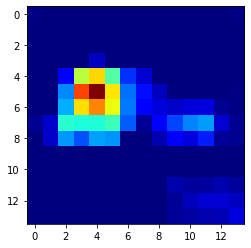

collie 12.58 %
(630, 1200, 3)
(14, 14)
(630, 1200)


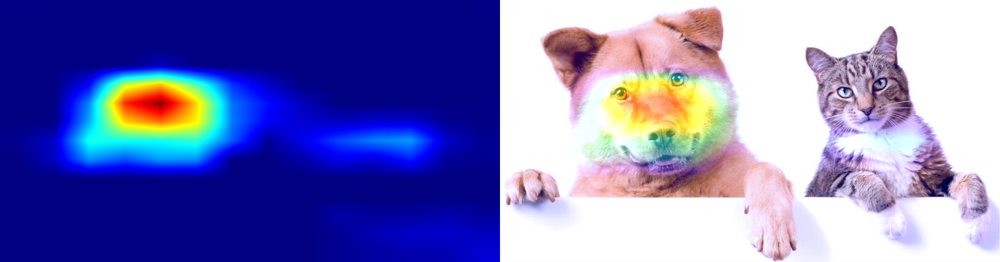

-----------------------------------------------------------


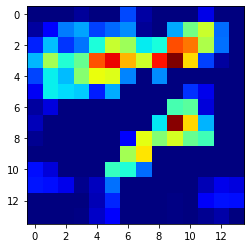

basenji 9.02 %
(630, 1200, 3)
(14, 14)
(630, 1200)


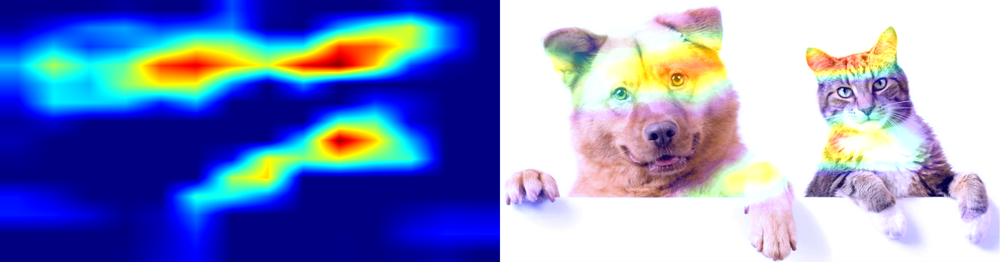

-----------------------------------------------------------


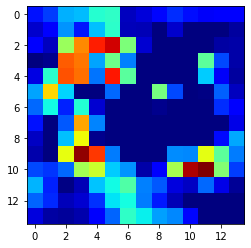

Airedale 7.87 %
(630, 1200, 3)
(14, 14)
(630, 1200)


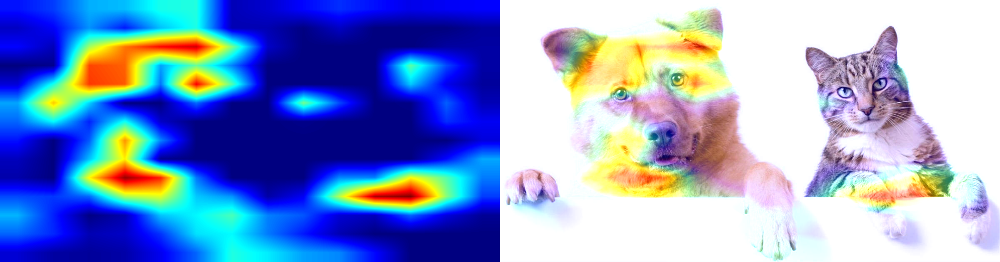

In [11]:
show_results('gc1.jpg', 'block5_conv3', top_class = 3, alpha=0.5)

### Image 2

<IPython.core.display.Javascript object>

(1, 224, 224, 3)
-----------------------------------------------------------


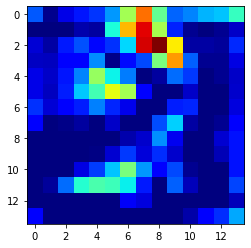

mushroom 91.44 %
(393, 700, 3)
(14, 14)
(393, 700)


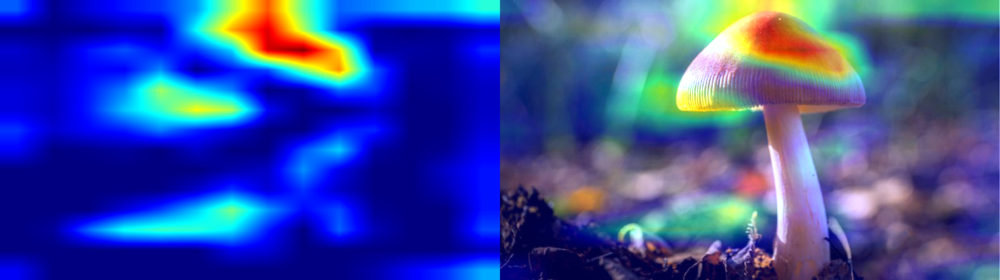

-----------------------------------------------------------


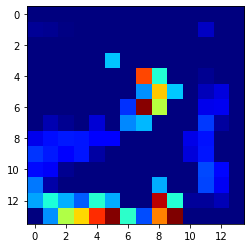

agaric 7.22 %
(393, 700, 3)
(14, 14)
(393, 700)


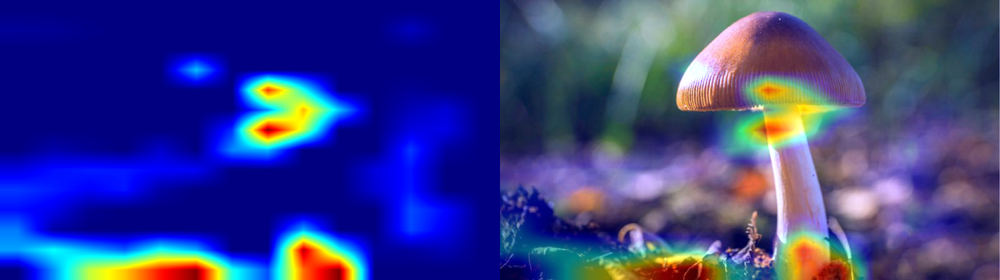

-----------------------------------------------------------


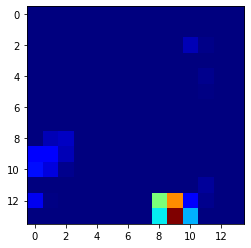

bolete 0.56 %
(393, 700, 3)
(14, 14)
(393, 700)


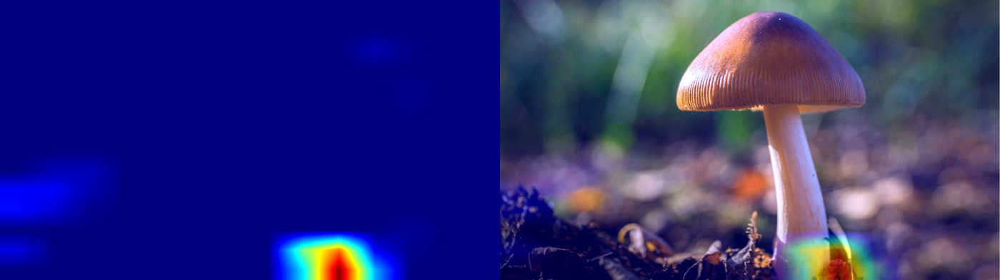

In [12]:
show_results('gc2.jpg', 'block5_conv3', top_class = 3, alpha=0.5)

### Image 3

<IPython.core.display.Javascript object>

(1, 224, 224, 3)
-----------------------------------------------------------


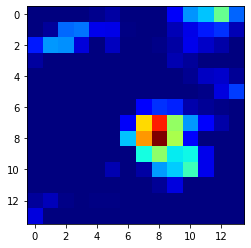

tow_truck 13.61 %
(553, 830, 3)
(14, 14)
(553, 830)


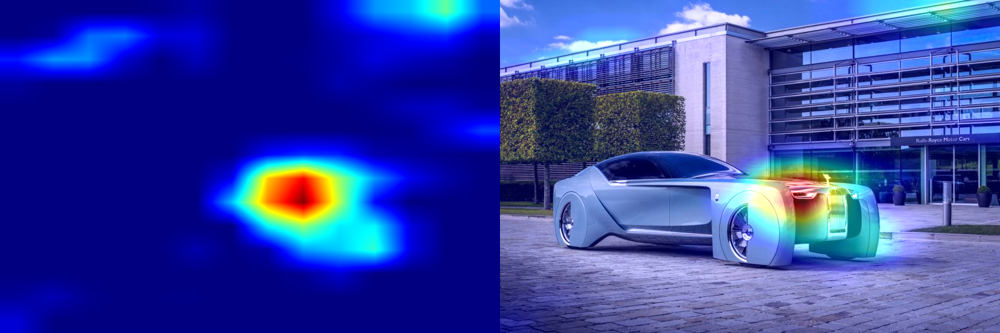

-----------------------------------------------------------


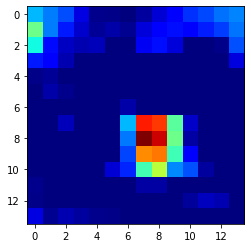

trailer_truck 12.87 %
(553, 830, 3)
(14, 14)
(553, 830)


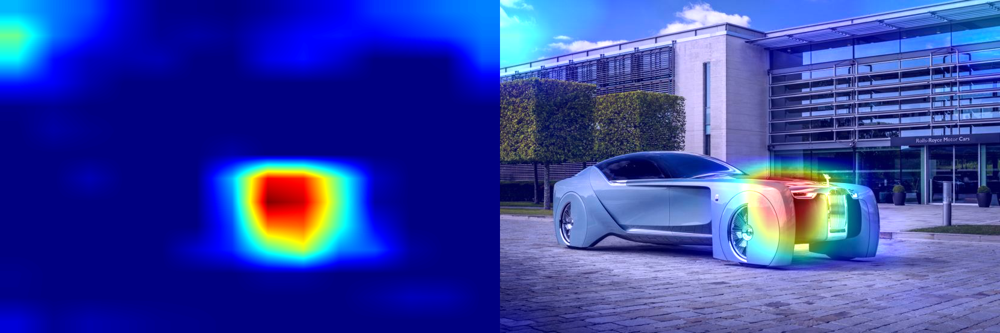

-----------------------------------------------------------


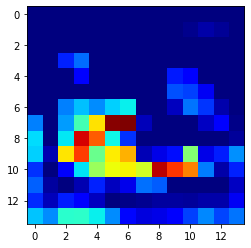

racer 11.69 %
(553, 830, 3)
(14, 14)
(553, 830)


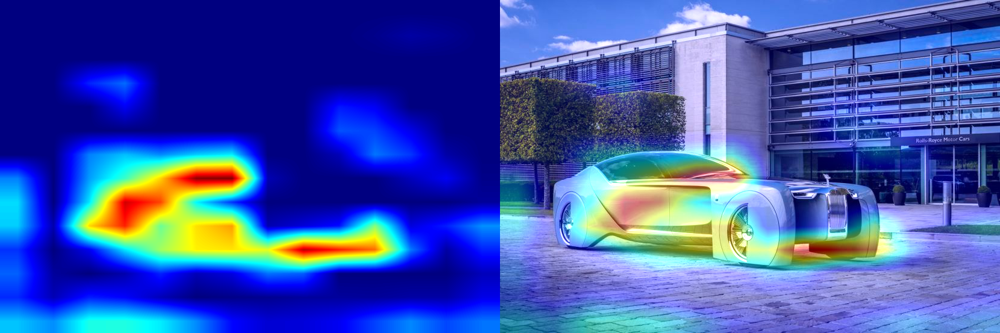

In [13]:
show_results('gc3.jpg', 'block5_conv3', top_class = 3, alpha=0.5)

### Image 4

<IPython.core.display.Javascript object>

(1, 224, 224, 3)
-----------------------------------------------------------


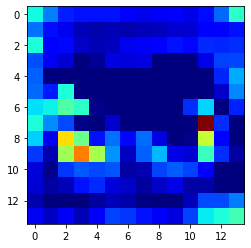

jack-o'-lantern 40.12 %
(595, 960, 3)
(14, 14)
(595, 960)


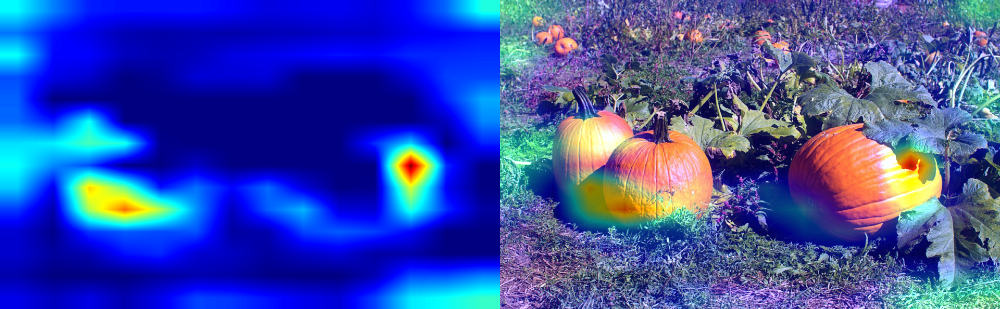

-----------------------------------------------------------


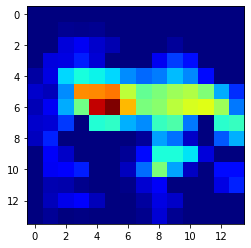

acorn_squash 21.86 %
(595, 960, 3)
(14, 14)
(595, 960)


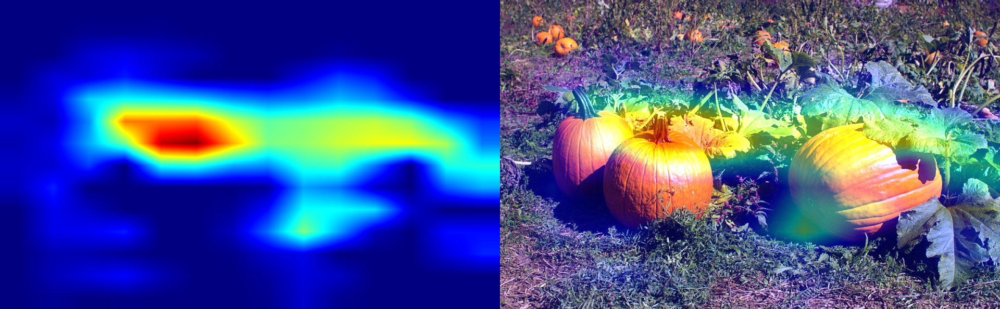

-----------------------------------------------------------


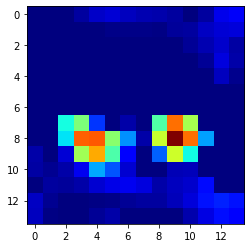

barrow 8.86 %
(595, 960, 3)
(14, 14)
(595, 960)


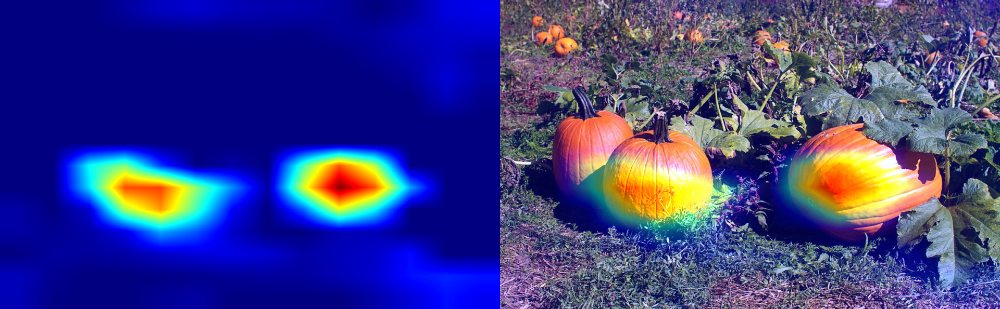

In [14]:
show_results('gc4.jpg', 'block5_conv3', top_class = 3, alpha=0.5)

### Image 5

<IPython.core.display.Javascript object>

(1, 224, 224, 3)
-----------------------------------------------------------


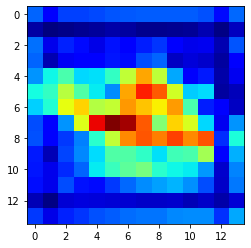

airliner 99.04 %
(533, 800, 3)
(14, 14)
(533, 800)


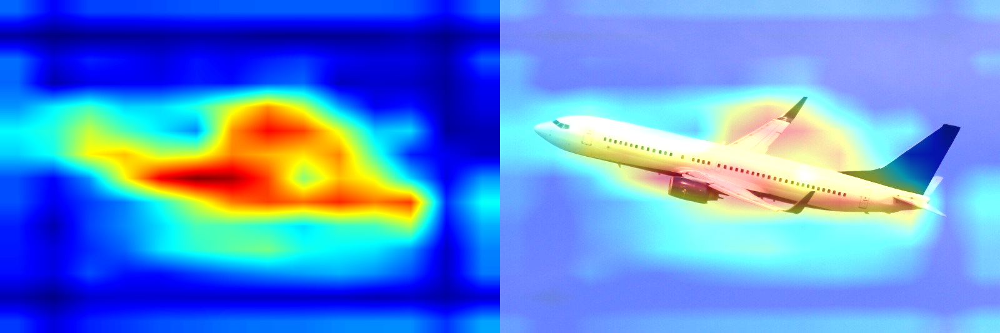

-----------------------------------------------------------


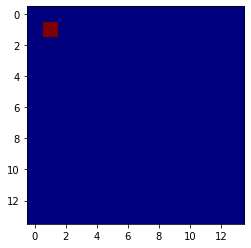

wing 0.93 %
(533, 800, 3)
(14, 14)
(533, 800)


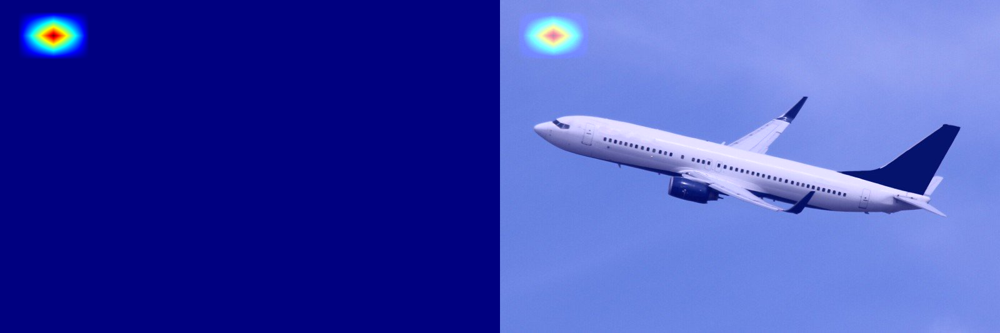

-----------------------------------------------------------


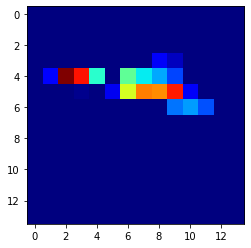

space_shuttle 0.02 %
(533, 800, 3)
(14, 14)
(533, 800)


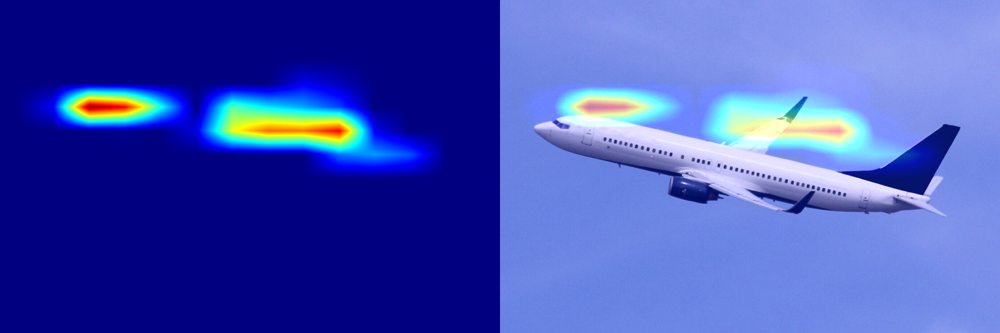

In [15]:
show_results('gc5.jpg', 'block5_conv3', top_class = 3, alpha=0.5)

### Image 6

<IPython.core.display.Javascript object>

(1, 224, 224, 3)
-----------------------------------------------------------


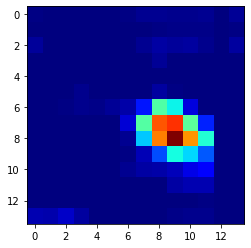

Shih-Tzu 32.81 %
(1280, 960, 3)
(14, 14)
(1280, 960)


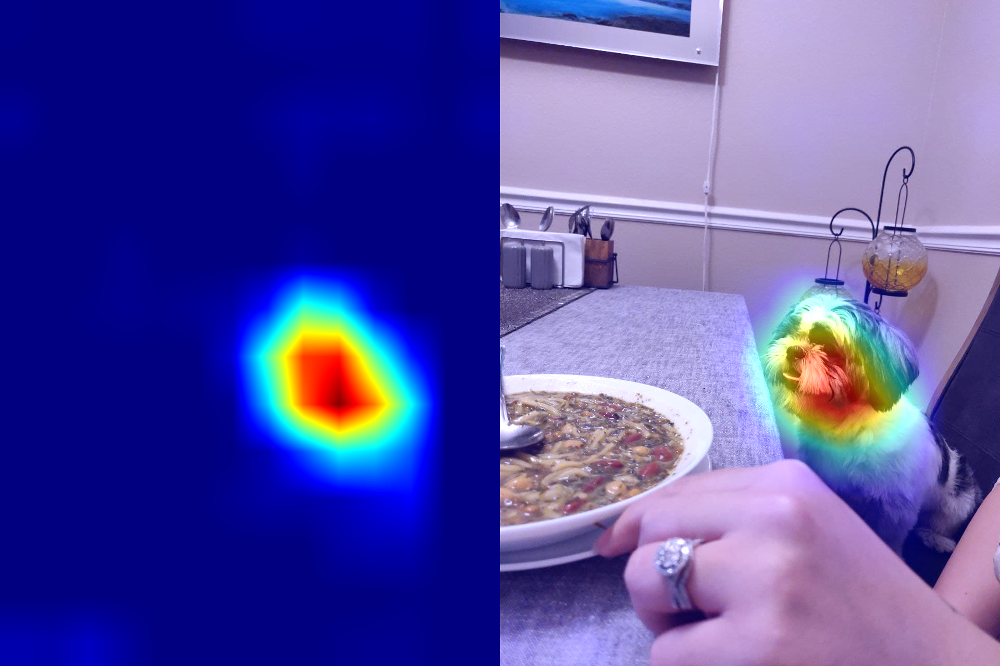

-----------------------------------------------------------


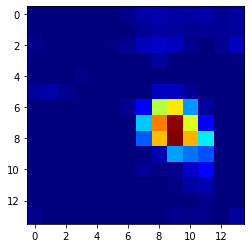

Lhasa 8.29 %
(1280, 960, 3)
(14, 14)
(1280, 960)


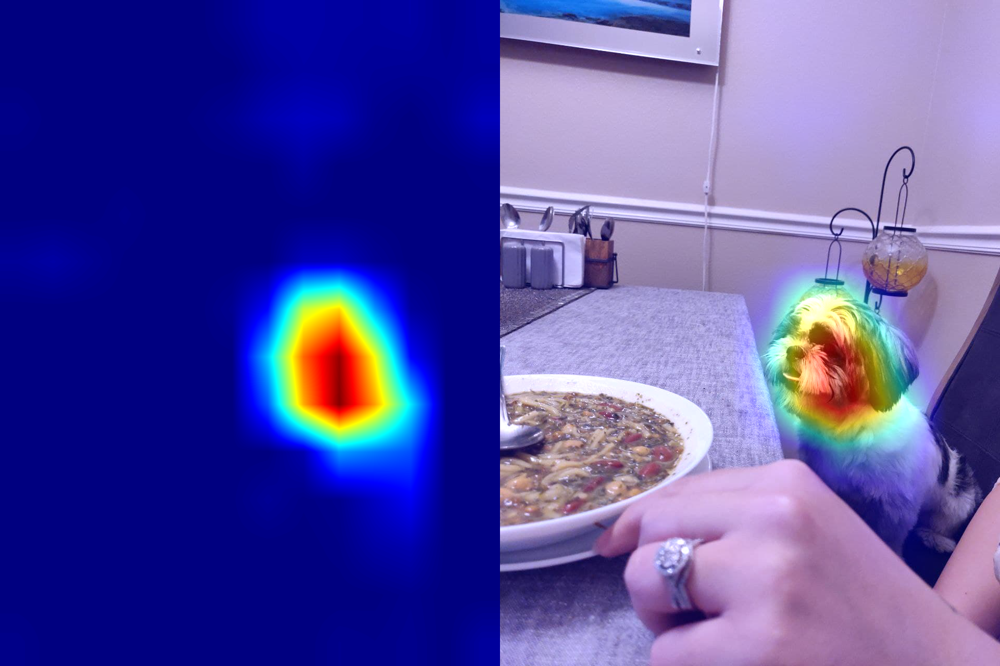

-----------------------------------------------------------


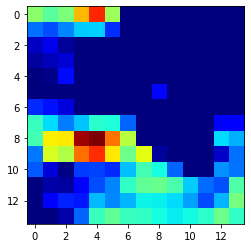

guinea_pig 6.08 %
(1280, 960, 3)
(14, 14)
(1280, 960)


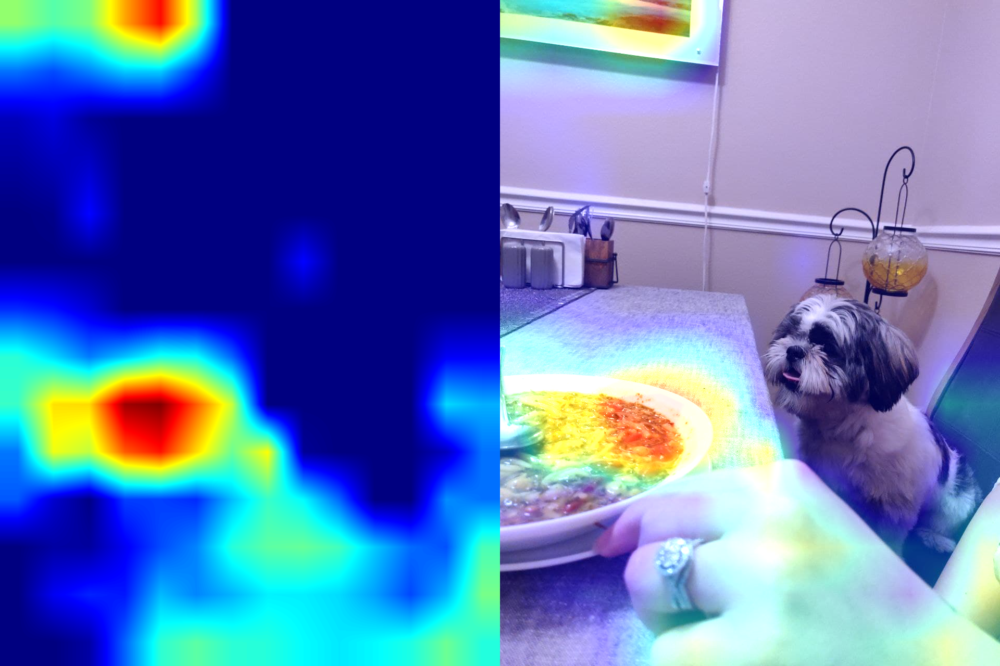

In [16]:
show_results('duke.jpg', 'block5_conv3', top_class = 3, alpha=0.5)

## Discussion

Even though, the VGG16 results are not very accurate, the results are interesting! For example, in image 4, the second prediction is acorn_squash, we can see the algorithm is looking at some part of pumpkin and the green leaves around it and concludes it is a acorn_squash. It is also interesting to see the attention of the algorithm when detecting a racer or a tow truck. Basenji prection was very funny since it is looking at the cats' ears and dog's face, it came to Basenji which has a cat shape ear. At last, I did not know the diffrerence between the Shih Tzu (our family's dog), and Lhasa. Imagenet classes showed me this, as we can see in the last image. 